In [408]:
# use codex_analysis conda environment
import scanpy as sc
import pandas as pd
import os
import scanpy.external as sce
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import sys
import seaborn as sns
import collections
sys.path.append('P:\\Projects\\Anogenital_p30\\Josh_codex\\cell_exports')
import codex_functions


In [2]:
data_dir = 'P:\\Projects\\Anogenital_p30\\Josh_codex\\cell_exports'

In [3]:
meta_df = pd.read_csv(data_dir + "\\codex_meta2.csv", index_col=0)
exprs_df = pd.read_csv(data_dir + "\\codex_clamped2.csv", index_col=0)
log_df = pd.read_csv(data_dir + "\\codex_log2.csv", index_col=0)
scale_df = pd.read_csv(data_dir + "\\codex_scaled2.csv", index_col=0)

In [4]:
meta_df.head()

,core,Image,Object.ID,Centroid.X.um,Centroid.Y.um,Nucleus_Area.um.2,Nucleus_Length.um,Nucleus_Circularity,Nucleus_Solidity,Nucleus_Max.diameter.um,Nucleus_Min.diameter.um,Cell_Area.um.2,Cell_Length.um,Cell_Circularity,Cell_Solidity,Cell_Max.diameter.um,Cell_Min.diameter.um,Nucleus.Cell.area.ratio
00043f34-26a7-46da-898f-1f1c824f82d6,B-11,B-11.ome.tif,00043f34-26a7-46da-898f-1f1c824f82d6,424.93,592.71,42.0057,23.3814,0.9656,1.0000,7.9197,6.8620,188.3851,51.2306,0.9020,0.9921,17.3457,14.5762,0.2230
000483fe-6fcd-441a-a2d0-4fb706622c25,B-11,B-11.ome.tif,000483fe-6fcd-441a-a2d0-4fb706622c25,700.51,651.22,37.0805,22.5566,0.9158,0.9978,8.2825,6.0676,51.5039,31.0004,0.6735,0.9029,11.6407,7.2662,0.7201
0006502f-9863-4697-85e0-ed14e377dde9,B-11,B-11.ome.tif,0006502f-9863-4697-85e0-ed14e377dde9,652.92,649.03,39.7863,22.8363,0.9587,1.0000,7.5952,6.9815,106.0343,39.8418,0.8394,0.9534,13.9870,11.0524,0.3752
000e65ec-565f-47e9-916e-58a004436ae0,B-11,B-11.ome.tif,000e65ec-565f-47e9-916e-58a004436ae0,892.56,306.25,20.3999,16.6415,0.9257,1.0000,5.8678,4.6491,61.4167,32.5580,0.7281,0.9494,12.0378,8.2800,0.3322
000f0b61-b878-4404-bf0b-43b22b3aa835,B-11,B-11.ome.tif,000f0b61-b878-4404-bf0b-43b22b3aa835,693.88,600.19,27.0352,18.9676,0.9443,1.0000,6.3661,5.5442,87.7509,36.8007,0.8142,0.9651,13.2901,10.9652,0.3081


In [5]:
adata = sc.AnnData(exprs_df) # first layer is clamped data (0.01 and 0.99 tile cutoffs)

In [6]:
# adding metadata, contains information for cores, cell centers, nucleus area, circularity, etc.
for col in meta_df.columns.tolist():
    adata.obs[col] = meta_df[col]

In [7]:
adata.layers['log_data'] = log_df
adata.layers['scale_data'] = scale_df

In [8]:
use_features = [feature for feature in adata.var_names if "Cell" in feature and "DAPI" not in feature]
print(use_features)

['Ki67_Cell_Mean', 'CD31_Cell_Mean', 'FOXP3_Cell_Mean', 'CD56_Cell_Mean', 'CD34_Cell_Mean', 'CD4_Cell_Mean', 'CD20_Cell_Mean', 'CD45_Cell_Mean', 'CD163_Cell_Mean', 'HLA.A_Cell_Mean', 'LAG3_Cell_Mean', 'CD8_Cell_Mean', 'SMA_Cell_Mean', 'PDL1_Cell_Mean', 'CD21_Cell_Mean', 'Pan.Cytokeratin_Cell_Mean', 'IDO1_Cell_Mean', 'b.Catenin1_Cell_Mean', 'CD14_Cell_Mean', 'PD.1_Cell_Mean', 'CD44_Cell_Mean', 'CD3e_Cell_Mean', 'CD45RO_Cell_Mean', 'CD68_Cell_Mean', 'Granzyme.B_Cell_Mean', 'HLA.DR_Cell_Mean', 'ICOS_Cell_Mean', 'HIF1A_Cell_Mean', 'CK17_Cell_Mean']


In [9]:
pca_features = adata.var_names.isin(use_features)
print(pca_features)

[False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True]


In [10]:
sc.tl.pca(adata, layer = 'scale_data', mask_var = pca_features)

In [11]:
len(use_features)

29

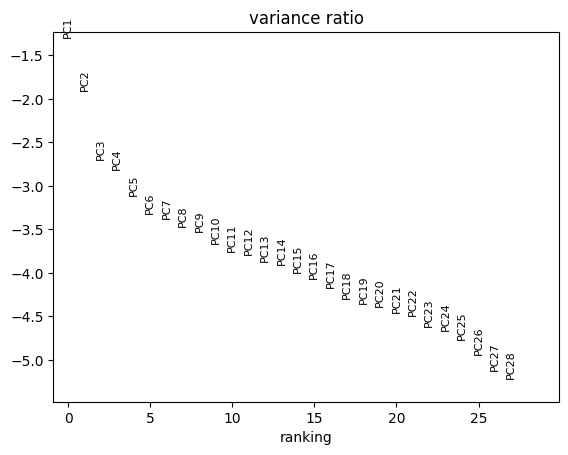

In [12]:
sc.pl.pca_variance_ratio(adata, log=True, n_pcs=len(use_features))

In [13]:
sce.pp.harmony_integrate(adata, key = "core", max_iter_harmony = 20) # converge at 8

2025-01-22 17:49:48,057 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-01-22 17:50:29,551 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-01-22 17:50:32,846 - harmonypy - INFO - Iteration 1 of 20
2025-01-22 17:59:46,609 - harmonypy - INFO - Iteration 2 of 20
2025-01-22 18:09:00,410 - harmonypy - INFO - Iteration 3 of 20
2025-01-22 18:18:14,672 - harmonypy - INFO - Iteration 4 of 20
2025-01-22 18:26:00,582 - harmonypy - INFO - Iteration 5 of 20
2025-01-22 18:33:24,217 - harmonypy - INFO - Iteration 6 of 20
2025-01-22 18:38:36,245 - harmonypy - INFO - Iteration 7 of 20
2025-01-22 18:43:27,736 - harmonypy - INFO - Iteration 8 of 20
2025-01-22 18:47:34,275 - harmonypy - INFO - Iteration 9 of 20
2025-01-22 18:51:40,607 - harmonypy - INFO - Iteration 10 of 20
2025-01-22 18:55:25,218 - harmonypy - INFO - Converged after 10 iterations


In [14]:
# save out adata object
adata.write_h5ad(data_dir + "\\adata_harmony_checkpoint2.h5ad")

In [15]:
# adata = sc.read_h5ad(data_dir + "\\adata_harmony_checkpoint2.h5ad")

In [16]:
# Calculating variance ratio for harmony embeddings
harmony_variance = np.var(adata.obsm['X_pca_harmony'], axis=0)
harmony_variance_ratio = harmony_variance / np.sum(harmony_variance)

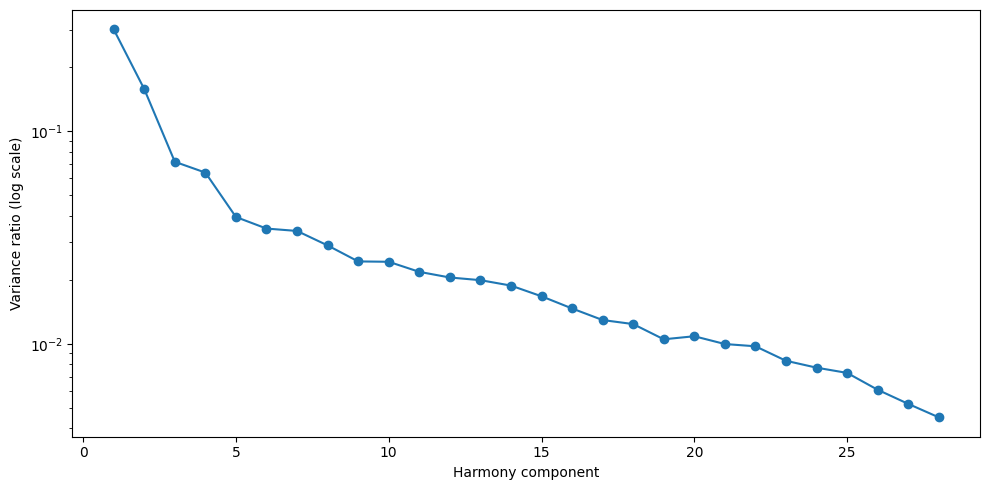

In [17]:
# plotting variance ratio, 20 selected
n_components = len(harmony_variance_ratio)
plt.figure(figsize=(10, 5))
plt.plot(range(1, n_components + 1), harmony_variance_ratio, 'o-')
plt.yscale('log')
plt.xlabel('Harmony component')
plt.ylabel('Variance ratio (log scale)')
plt.tight_layout()
plt.show()

In [18]:
sc.pp.neighbors(adata, n_neighbors = 15, n_pcs = 20, use_rep = "X_pca_harmony")

C:\Users\hdlab\miniconda3\envs\codex_analysis\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [19]:
for res in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    print(res)
    sc.tl.leiden(adata, resolution = res, key_added = f'leiden_{res}')

0.1


C:\Users\hdlab\AppData\Local\Temp\ipykernel_10976\897182273.py:3: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution = res, key_added = f'leiden_{res}')


0.2
0.3
0.4
0.5
0.6
0.7
0.8
0.9
1.0


In [20]:
# adata.write_h5ad(data_dir + "\\adata_clustering_checkpoint2.h5ad")
# adata = sc.read_h5ad(data_dir + "\\adata_clustering_checkpoint.h5ad")

In [21]:
sc.tl.umap(adata)

In [466]:
# adata.write_h5ad(data_dir + "\\adata_umap_checkpoint2.h5ad")
adata = sc.read_h5ad(data_dir + "\\adata_umap_checkpoint2.h5ad")

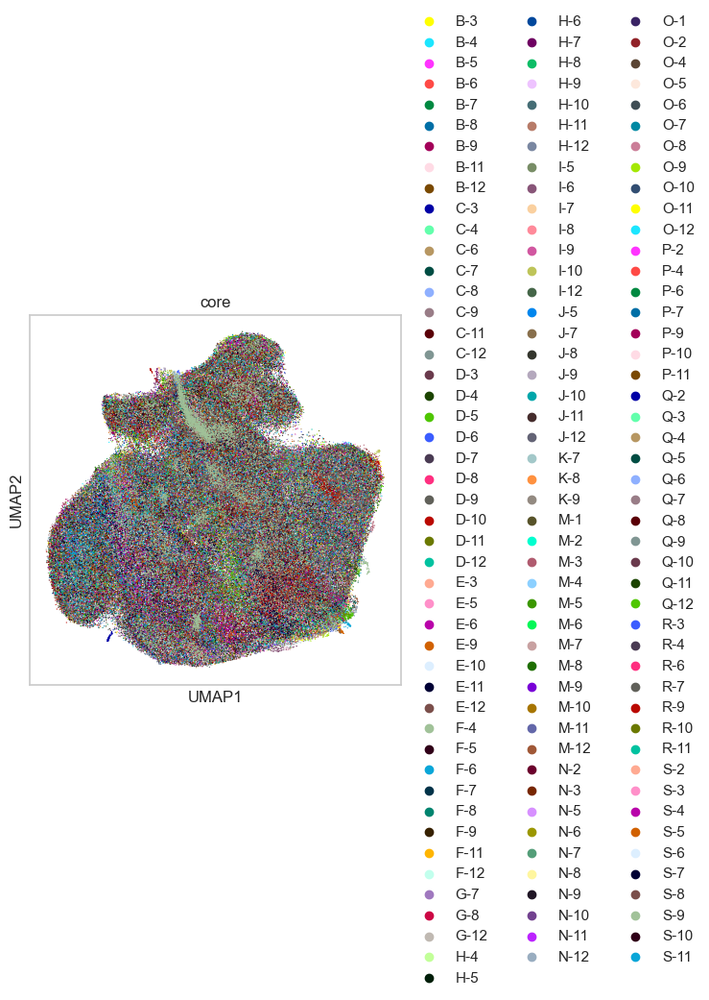

In [467]:
sc.pl.umap(adata,
           palette = sc.pl.palettes.default_102,
           color = ["core"],
           size = 3,
           ncols=2)

In [468]:
for gene in adata.var_names:
    if "Cell_Mean" in gene:
        print(gene)

DAPI_Cell_Mean
Ki67_Cell_Mean
CD31_Cell_Mean
FOXP3_Cell_Mean
CD56_Cell_Mean
CD34_Cell_Mean
CD4_Cell_Mean
CD20_Cell_Mean
CD45_Cell_Mean
CD163_Cell_Mean
HLA.A_Cell_Mean
LAG3_Cell_Mean
CD8_Cell_Mean
SMA_Cell_Mean
PDL1_Cell_Mean
CD21_Cell_Mean
Pan.Cytokeratin_Cell_Mean
IDO1_Cell_Mean
b.Catenin1_Cell_Mean
CD14_Cell_Mean
PD.1_Cell_Mean
CD44_Cell_Mean
CD3e_Cell_Mean
CD45RO_Cell_Mean
CD68_Cell_Mean
Granzyme.B_Cell_Mean
HLA.DR_Cell_Mean
ICOS_Cell_Mean
HIF1A_Cell_Mean
CK17_Cell_Mean


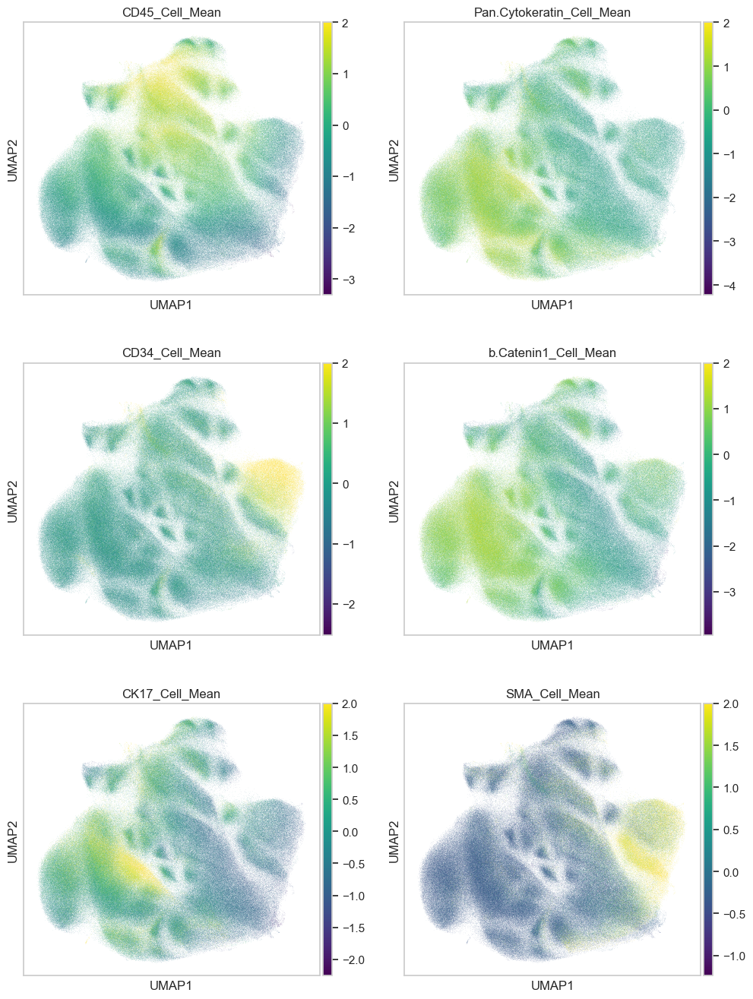

In [469]:
sc.pl.umap(adata, 
           layer="scale_data", 
           vmax =  [2, 2, 2, 2, 2, 2],
           color = ["CD45_Cell_Mean", 
                    "Pan.Cytokeratin_Cell_Mean", 
                   "CD34_Cell_Mean", "b.Catenin1_Cell_Mean",
                   "CK17_Cell_Mean", "SMA_Cell_Mean"],
           color_map = 'viridis',
           ncols=2)

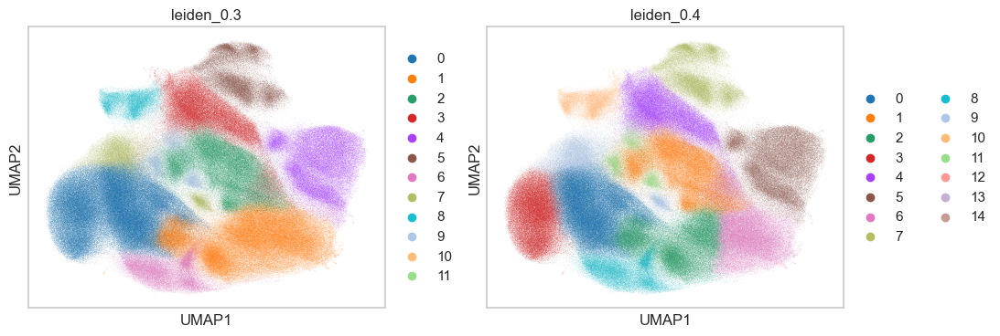

In [470]:
%matplotlib inline
plt.rcParams['figure.figsize'] = [5, 4] # Sets the default figure size to 10x8 inches

sc.pl.umap(adata, 
           color = ["leiden_0.3", "leiden_0.4"], 
           ncols = 2)

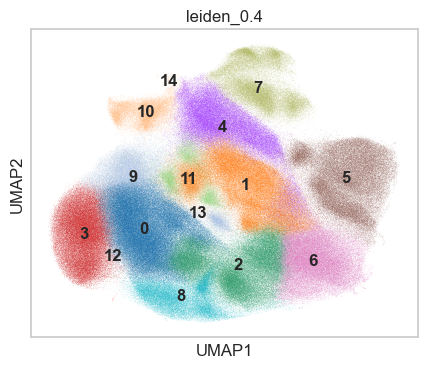

In [471]:
plt.rcParams['figure.figsize'] = [5, 4] 
sc.pl.umap(adata, 
           color = ["leiden_0.4"], 
           ncols = 1, 
           legend_loc= "on data"
          )

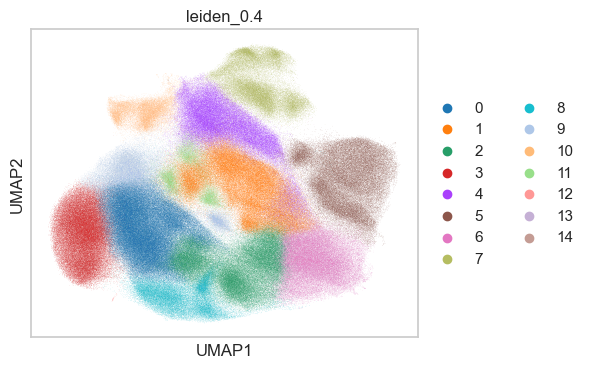

{'0': '#1f77b4',
 '1': '#ff7f0e',
 '2': '#279e68',
 '3': '#d62728',
 '4': '#aa40fc',
 '5': '#8c564b',
 '6': '#e377c2',
 '7': '#b5bd61',
 '8': '#17becf',
 '9': '#aec7e8',
 '10': '#ffbb78',
 '11': '#98df8a',
 '12': '#ff9896',
 '13': '#c5b0d5',
 '14': '#c49c94'}

In [472]:
sc.pl.umap(adata, color='leiden_0.4')
color_dict = dict(zip(adata.obs['leiden_0.4'].cat.categories, adata.uns['leiden_0.4_colors']))
color_dict

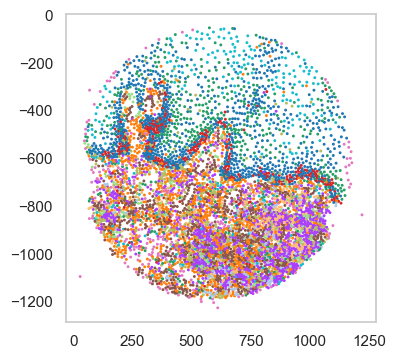

In [478]:
plt.rcParams['figure.figsize'] = [4, 4] 
plt.grid(False)
this_core = 'O-11'
clst = 'leiden_0.4'

filtered_df = adata.obs.loc[adata.obs["core"] == this_core, :]

# Get unique values
unique_labels = filtered_df[clst].unique()
n_colors = len(unique_labels)

mapped = filtered_df[clst].tolist()

color_mapping = [color_dict.get(key, "gray") for key in mapped]
color_mapping

plt.scatter(x = filtered_df['Centroid.X.um'], y = -1*filtered_df['Centroid.Y.um'], c = color_mapping, s = 1.2)
plt.show()

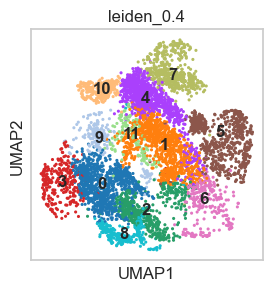

In [479]:
# Get unique values
plt.rcParams['figure.figsize'] = [3, 3] # Sets the default figure size to 10x8 inches
sc.pl.umap(adata[adata.obs['core'] == this_core], 
           color = ["leiden_0.4"],
           legend_loc = "on data",
           ncols = 2)

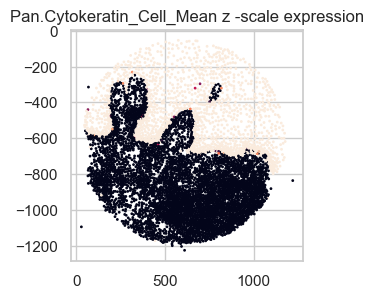

In [480]:
codex_functions.plot_marker(adata, core = "O-11", marker = "Pan.Cytokeratin_Cell_Mean", vmin = 0.95, vmax = 0.99)

uclusters
Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11'], dtype='object')
['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11']


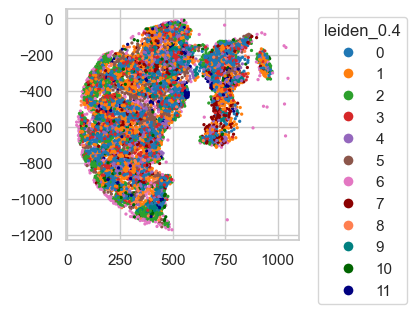

In [481]:
codex_functions.plot_clusters(adata_obj = adata, core = "O-12", res = "leiden_0.4")

In [482]:
# read in of other data:
annotations = pd.read_csv(data_dir + "\\early_seurat_annotations.csv", header = 0)
annotations.columns

Index(['Object.ID', 'annotations'], dtype='object')

In [483]:
annotations["Object.ID"].tolist()
annotations = annotations.set_index("Object.ID")

In [484]:
merged = adata.obs.merge(annotations, how = "left", left_index=True, right_index=True)
print(adata.obs.shape)
print(merged.shape)
merged.columns
# merged['Centroid.Y.um'] = merged['Centroid.Y.um']*-1

(802048, 28)
(802048, 29)


Index(['core', 'Image', 'Object.ID', 'Centroid.X.um', 'Centroid.Y.um',
       'Nucleus_Area.um.2', 'Nucleus_Length.um', 'Nucleus_Circularity',
       'Nucleus_Solidity', 'Nucleus_Max.diameter.um',
       'Nucleus_Min.diameter.um', 'Cell_Area.um.2', 'Cell_Length.um',
       'Cell_Circularity', 'Cell_Solidity', 'Cell_Max.diameter.um',
       'Cell_Min.diameter.um', 'Nucleus.Cell.area.ratio', 'leiden_0.1',
       'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 'leiden_0.6',
       'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0', 'annotations'],
      dtype='object')

In [485]:
#merged['annotations'] = merged['annotations'].cat.add_categories(["missing"])
merged['annotations'].fillna("missing",inplace=True)


C:\Users\hdlab\AppData\Local\Temp\ipykernel_10976\201819358.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  merged['annotations'].fillna("missing",inplace=True)


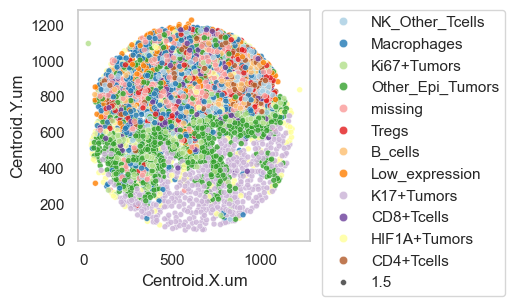

In [487]:
plt.grid(False)
clrs = sns.color_palette("Paired")
core = "O-11"
sns.scatterplot(data=merged.loc[merged["core"] == core],x = "Centroid.X.um", y = "Centroid.Y.um", hue = 'annotations', size = 1.5, alpha = 0.8, palette= clrs)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)

In [488]:
core = "O-11"
plot_markers = []
for marker in adata.var_names:
    if "Cell" in marker:
        plot_markers.append(marker)

print(plot_markers)

['DAPI_Cell_Mean', 'Ki67_Cell_Mean', 'CD31_Cell_Mean', 'FOXP3_Cell_Mean', 'CD56_Cell_Mean', 'CD34_Cell_Mean', 'CD4_Cell_Mean', 'CD20_Cell_Mean', 'CD45_Cell_Mean', 'CD163_Cell_Mean', 'HLA.A_Cell_Mean', 'LAG3_Cell_Mean', 'CD8_Cell_Mean', 'SMA_Cell_Mean', 'PDL1_Cell_Mean', 'CD21_Cell_Mean', 'Pan.Cytokeratin_Cell_Mean', 'IDO1_Cell_Mean', 'b.Catenin1_Cell_Mean', 'CD14_Cell_Mean', 'PD.1_Cell_Mean', 'CD44_Cell_Mean', 'CD3e_Cell_Mean', 'CD45RO_Cell_Mean', 'CD68_Cell_Mean', 'Granzyme.B_Cell_Mean', 'HLA.DR_Cell_Mean', 'ICOS_Cell_Mean', 'HIF1A_Cell_Mean', 'CK17_Cell_Mean']


C:\Users\hdlab\miniconda3\envs\codex_analysis\Lib\site-packages\scanpy\tools\_dendrogram.py:193: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = dat


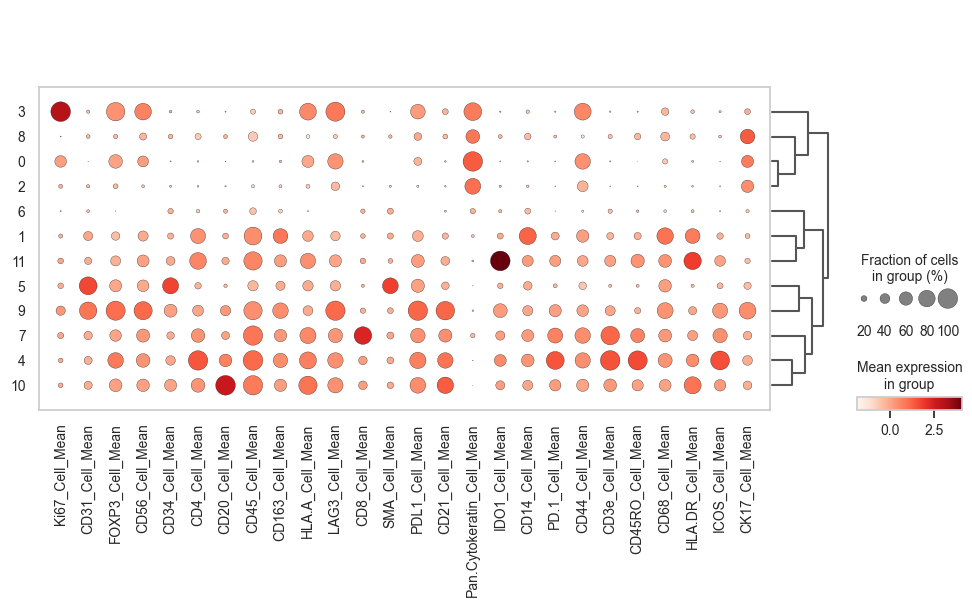

In [489]:
adata_subset = adata[adata.obs['core'] == core]

plot_markers = []
moi = ["CD45", "Ki67", "CD31", "FOXP3", "CD56", "CD34", "CD4", "CD20", "CD45", "CD163", "HLA.A", "LAG3",
       "SMA", "CD8", "PDL1", "CD21", "Pan.Cytokeratin", "IDO1", "b.Cetenin1", "CD14", "PD.1", "CD44", "CD3e",
       "CD45RO", "CD68", "Granzyme", "HLA.DR", "ICOS", "HIF1", "CK17"]

moi=[elem+"_Cell_Mean" for elem in moi]

plot_markers = [s for s in adata.var_names.tolist() if any(sub in s for sub in moi)]

sc.tl.dendrogram(adata = adata_subset, groupby = "leiden_0.4",cor_method = "spearman")
sc.pl.dotplot(adata = adata_subset, var_names = plot_markers, groupby = "leiden_0.4", layer = "scale_data", use_raw = False, dendrogram = True)

In [490]:
adata.obs[['leiden_0.4', 'core']].value_counts()

leiden_0.4  core
2           N-10    4054
0           N-10    3661
            M-8     3452
3           M-8     3279
0           B-3     3231
                    ... 
12          N-6        1
            N-8        1
            N-9        1
            Q-9        1
10          D-7        1
Name: count, Length: 1687, dtype: int64

In [491]:
# read back in post cluster data:
strepi_clusters = pd.read_csv(data_dir + "\\strepi_clusters.csv")
immune_clusters = pd.read_csv(data_dir + "\\immune_clusters.csv")

strepi_clusters.set_index('Object.ID')
immune_clusters.set_index('Object.ID')

,Unnamed: 0,clustering,from
Object.ID,,,
000483fe-6fcd-441a-a2d0-4fb706622c25,000483fe-6fcd-441a-a2d0-4fb706622c25,immune_0,immune_leiden_0.8
000f0b61-b878-4404-bf0b-43b22b3aa835,000f0b61-b878-4404-bf0b-43b22b3aa835,immune_7,immune_leiden_0.8
0017f180-5dec-480e-9bff-b5f76edab2bf,0017f180-5dec-480e-9bff-b5f76edab2bf,immune_11,immune_leiden_0.8
0071cbda-2011-41d1-abd2-6c960c5440f2,0071cbda-2011-41d1-abd2-6c960c5440f2,immune_0,immune_leiden_0.8
00b8e26c-9d6d-4e04-b4df-6008a43fdc18,00b8e26c-9d6d-4e04-b4df-6008a43fdc18,immune_10,immune_leiden_0.8
...,...,...,...
ffbf5e30-de2c-4b8b-ad95-b639c2b22a7c,ffbf5e30-de2c-4b8b-ad95-b639c2b22a7c,immune_6,immune_leiden_0.8
ffc3b120-5520-437a-9a33-d36ab732e4b0,ffc3b120-5520-437a-9a33-d36ab732e4b0,immune_4,immune_leiden_0.8
ffd6ef11-5a8f-4c19-ad00-6576696a3a37,ffd6ef11-5a8f-4c19-ad00-6576696a3a37,immune_3,immune_leiden_0.8


In [492]:
cluster_maps = pd.concat([immune_clusters, strepi_clusters], axis = 0)[['Object.ID', 'clustering', 'from']]
cluster_maps.set_index('Object.ID')

,clustering,from
Object.ID,,
000483fe-6fcd-441a-a2d0-4fb706622c25,immune_0,immune_leiden_0.8
000f0b61-b878-4404-bf0b-43b22b3aa835,immune_7,immune_leiden_0.8
0017f180-5dec-480e-9bff-b5f76edab2bf,immune_11,immune_leiden_0.8
0071cbda-2011-41d1-abd2-6c960c5440f2,immune_0,immune_leiden_0.8
00b8e26c-9d6d-4e04-b4df-6008a43fdc18,immune_10,immune_leiden_0.8
...,...,...
ffadec32-1f12-4a4d-908e-310f4744b8e9,strepi_10,strepi_leiden_0.6
ffb259b9-83dc-4922-a8ec-31ecdfad2c0f,strepi_7,strepi_leiden_0.6
ffc5e219-545f-4018-ba52-9080c75e4261,strepi_9,strepi_leiden_0.6


In [493]:
adata.obs.columns
adata.obs = adata.obs.merge(cluster_maps, how = "left", on = 'Object.ID')

In [494]:
ix = adata.obs['clustering'].isna()

# Convert to string type
adata.obs['from'] = adata.obs['from'].astype(str)
adata.obs['clustering'] = adata.obs['clustering'].astype(str)

In [495]:
# Replace NaN values in 'clustering' column
adata.obs.loc[ix, 'clustering'] = 'og_' + df['leiden_0.4'].astype(str)

# Replace NaN values in 'from' column
adata.obs.loc[ix, 'from'] = 'og_leiden_0.4'


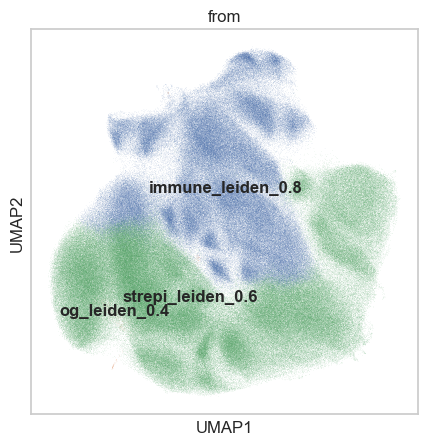

In [500]:
plt.rcParams['figure.figsize'] = [5, 5]
sc.pl.umap(adata, 
           color = ['from'],
           legend_loc = "on data",
           ncols = 2)

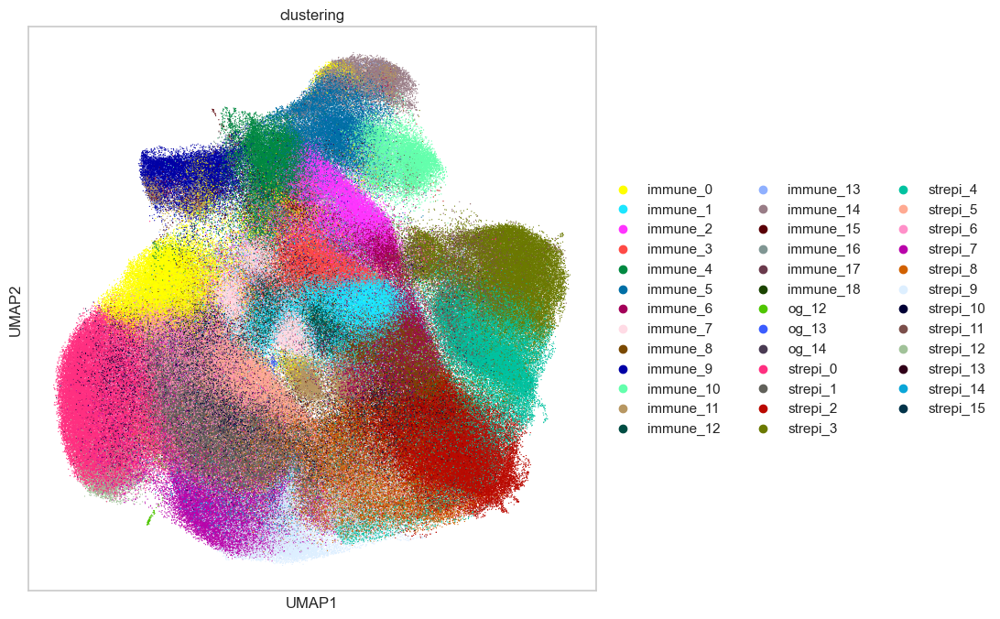

In [507]:
plt.rcParams['figure.figsize'] = [8, 8]
sc.pl.umap(adata, 
           color = ['clustering'],
           ncols = 1, size = 3)

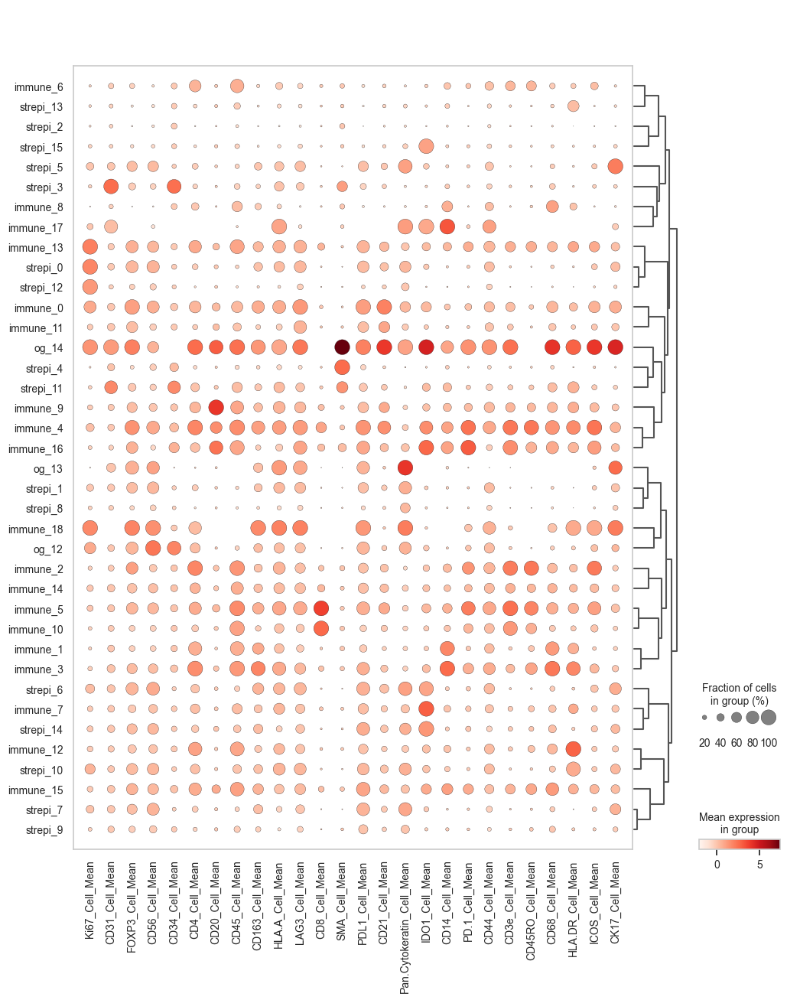

['Ki67_Cell_Mean', 'CD31_Cell_Mean', 'FOXP3_Cell_Mean', 'CD56_Cell_Mean', 'CD34_Cell_Mean', 'CD4_Cell_Mean', 'CD20_Cell_Mean', 'CD45_Cell_Mean', 'CD163_Cell_Mean', 'HLA.A_Cell_Mean', 'LAG3_Cell_Mean', 'CD8_Cell_Mean', 'SMA_Cell_Mean', 'PDL1_Cell_Mean', 'CD21_Cell_Mean', 'Pan.Cytokeratin_Cell_Mean', 'IDO1_Cell_Mean', 'CD14_Cell_Mean', 'PD.1_Cell_Mean', 'CD44_Cell_Mean', 'CD3e_Cell_Mean', 'CD45RO_Cell_Mean', 'CD68_Cell_Mean', 'HLA.DR_Cell_Mean', 'ICOS_Cell_Mean', 'CK17_Cell_Mean']


In [675]:
plot_markers = []
moi = ["CD45", "Ki67", "CD31", "FOXP3", "CD56", "CD34", "CD4", "CD20", "CD45", "CD163", "HLA.A", "LAG3",
       "SMA", "CD8", "PDL1", "CD21", "Pan.Cytokeratin", "IDO1", "b.Cetenin1", "CD14", "PD.1", "CD44", "CD3e",
       "CD45RO", "CD68", "Granzyme", "HLA.DR", "ICOS", "HIF1", "CK17"]

moi=[elem+"_Cell_Mean" for elem in moi]

plot_markers = [s for s in adata.var_names.tolist() if any(sub in s for sub in moi)]

sc.tl.dendrogram(adata = adata, groupby = 'clustering',cor_method = 'spearman')
sc.pl.dotplot(adata = adata, var_names = plot_markers, groupby = 'clustering', 
              layer = 'scale_data', use_raw = True, dendrogram = True)

In [733]:
foi = [feat for feat in adata.var_names if "Cell_Mean" in feat]
marker_masks = {marker: adata.var_names == marker for marker in foi}

exprs_df = pd.DataFrame()
marker
for marker in marker_masks.keys():
    marker_loc = marker_masks[marker]
    vals = adata.layers['log_data'][:,marker_loc].flatten()
    exprs_df[marker] = np.round(vals, 4)

coords = adata.obs[['Centroid.X.um', 'Centroid.Y.um']]

,Centroid.X.um,Centroid.Y.um
0,424.93,592.71
1,700.51,651.22
2,652.92,649.03
3,892.56,306.25
4,693.88,600.19
...,...,...
802043,634.24,408.02
802044,400.15,191.57
802045,1038.90,265.98
802046,491.86,935.12


In [735]:
# write out for statistics / plotting in R
out_df = pd.DataFrame({
'Object.ID':adata.obs['Object.ID'],
'clustering': adata.obs['clustering'], 
'from':adata.obs['from']})

fi_out_df = pd.concat([out_df, coords, exprs_df], axis = 1)

fi_out_df.to_csv("data_for_presentation.csv")


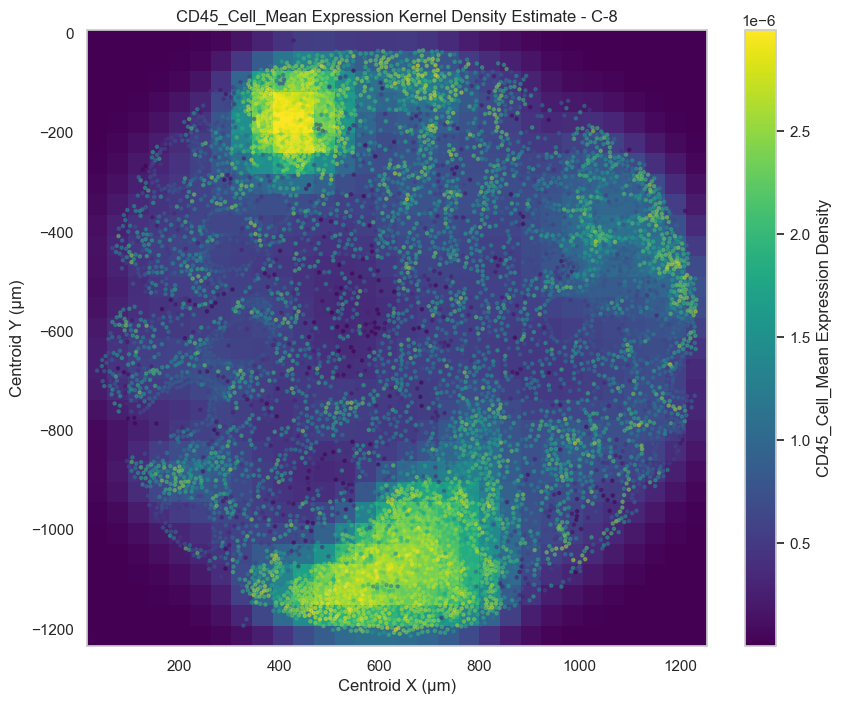

In [557]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import KernelDensity
import seaborn as sns

my_var = "CD45_Cell_Mean"
# Extract data for core B-12
core = 'C-8'
sset = adata[adata.obs['core'] == core]

# Get the index of CD45 in var names
feature_idx = np.where(adata.var_names == my_var)[0][0]

# Extract coordinates and expression values
x = sset.obs['Centroid.X.um'].values
y = -1*sset.obs['Centroid.Y.um'].values
exprs = sset.layers['log_data'][:, feature_idx].flatten()

# Combine coordinates
coords = np.vstack([x, y]).T

# Fit the kernel density model
kde = KernelDensity(bandwidth = 50, kernel='gaussian')
kde.fit(coords, sample_weight=exprs)

# Create a grid for density estimation
x_grid, y_grid = np.meshgrid(np.linspace(x.min(), x.max(), 30),
                             np.linspace(y.min(), y.max(), 30))
xy_grid = np.vstack([x_grid.ravel(), y_grid.ravel()]).T

# Estimate the density on the grid
z = np.exp(kde.score_samples(xy_grid))
z = z.reshape(x_grid.shape)

# Plot
plt.figure(figsize=(10, 8))
plt.pcolormesh(x_grid, y_grid, z, shading='auto', cmap='viridis')
plt.colorbar(label=f'{my_var} Expression Density')
plt.scatter(x, y, c=exprs, s=5, cmap='viridis', alpha=0.5)
plt.xlabel('Centroid X (µm)')
plt.ylabel('Centroid Y (µm)')
plt.title(f'{my_var} Expression Kernel Density Estimate - {core}')
plt.show()



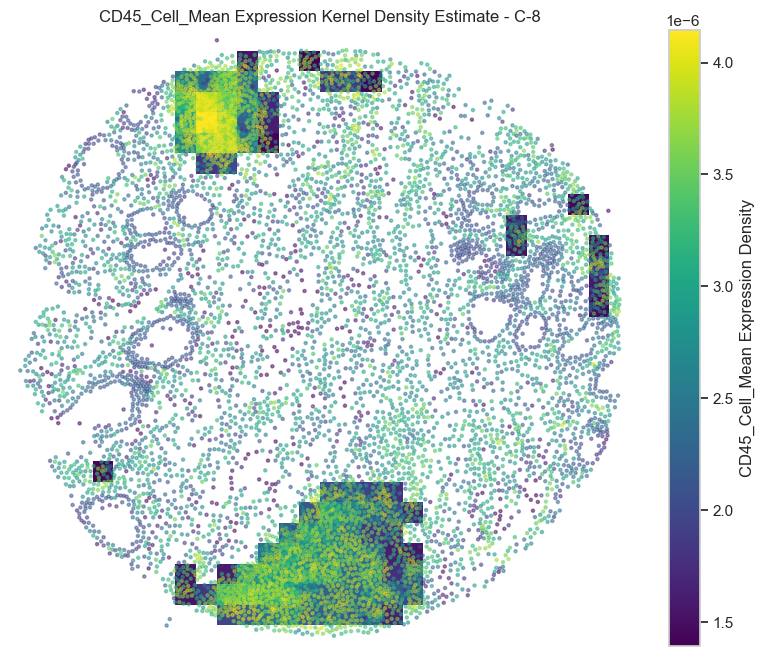

In [576]:

my_var = "CD45_Cell_Mean"
# Extract data for core B-12
core = 'C-8'
sset = adata[adata.obs['core'] == core]

# Get the index of CD45 in var names
feature_idx = np.where(adata.var_names == my_var)[0][0]

# Extract coordinates and expression values
x = sset.obs['Centroid.X.um'].values
y = -1*sset.obs['Centroid.Y.um'].values
exprs = sset.layers['log_data'][:, feature_idx].flatten()

# Combine coordinates
coords = np.vstack([x, y]).T

# Fit the kernel density model
kde = KernelDensity(bandwidth = 20, kernel='gaussian')
kde.fit(coords, sample_weight=exprs)

# Create a grid for density estimation
x_grid, y_grid = np.meshgrid(np.linspace(x.min(), x.max(), 30),
                             np.linspace(y.min(), y.max(), 30))
xy_grid = np.vstack([x_grid.ravel(), y_grid.ravel()]).T

# Estimate the density on the grid
z = np.exp(kde.score_samples(xy_grid))
z = z.reshape(x_grid.shape)

# Create a mask based on a density threshold
density_threshold = np.percentile(z, 90)  # Adjust this value to change the masking level
mask = z > density_threshold

# Plot
plt.figure(figsize=(10, 8))
plt.pcolormesh(x_grid, y_grid, np.where(mask, z, np.nan), shading='auto', cmap='viridis')
plt.colorbar(label=f'{my_var} Expression Density')
plt.scatter(x, y, c=exprs, s=5, cmap='viridis', alpha=0.5)
plt.xlabel('Centroid X (µm)')
plt.ylabel('Centroid Y (µm)')
plt.title(f'{my_var} Expression Kernel Density Estimate - {core}')
plt.axis('off')
plt.show()


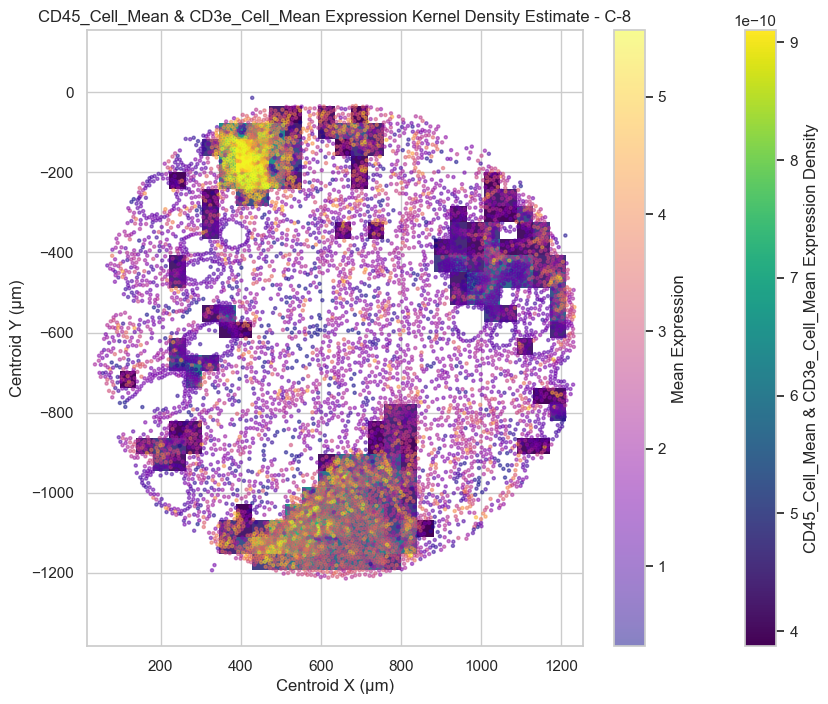

In [577]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import KernelDensity

# Define variables and core
vars = ["CD45_Cell_Mean", "CD3e_Cell_Mean"]
core = 'C-8'

# Extract data for the specified core
sset = adata[adata.obs['core'] == core]

# Get the indices of CD45 and CD3e in var names
feature_idxs = [np.where(adata.var_names == var)[0][0] for var in vars]

# Extract coordinates
x = sset.obs['Centroid.X.um'].values
y = -1 * sset.obs['Centroid.Y.um'].values

# Extract expression values
exprs = sset.layers['log_data'][:, feature_idxs]

# Combine coordinates and expressions
coords_exprs = np.column_stack([x, y, exprs])

# Fit the kernel density model
kde = KernelDensity(bandwidth=20, kernel='gaussian')
kde.fit(coords_exprs)

# Create a grid for density estimation
x_grid, y_grid = np.meshgrid(np.linspace(x.min(), x.max(), 30),
                             np.linspace(y.min(), y.max(), 30))
xy_grid = np.vstack([x_grid.ravel(), y_grid.ravel()]).T

# Estimate the density on the grid
z = np.exp(kde.score_samples(np.column_stack([xy_grid, np.zeros((xy_grid.shape[0], 2))])))
z = z.reshape(x_grid.shape)

# Create a mask based on a density threshold
density_threshold = np.percentile(z, 80)  # Adjust this value to change the masking level
mask = z > density_threshold

# Calculate combined expression for coloring
combined_expr = np.mean(exprs, axis=1)

# Plot
plt.figure(figsize=(10, 8))
plt.pcolormesh(x_grid, y_grid, np.where(mask, z, np.nan), shading='auto', cmap='viridis')
plt.colorbar(label=f'{" & ".join(vars)} Expression Density')
scatter = plt.scatter(x, y, c=combined_expr, s=5, cmap='plasma', alpha=0.5)
plt.colorbar(scatter, label='Mean Expression')
plt.xlabel('Centroid X (µm)')
plt.ylabel('Centroid Y (µm)')
plt.title(f'{" & ".join(vars)} Expression Kernel Density Estimate - {core}')
plt.axis('equal')
plt.show()


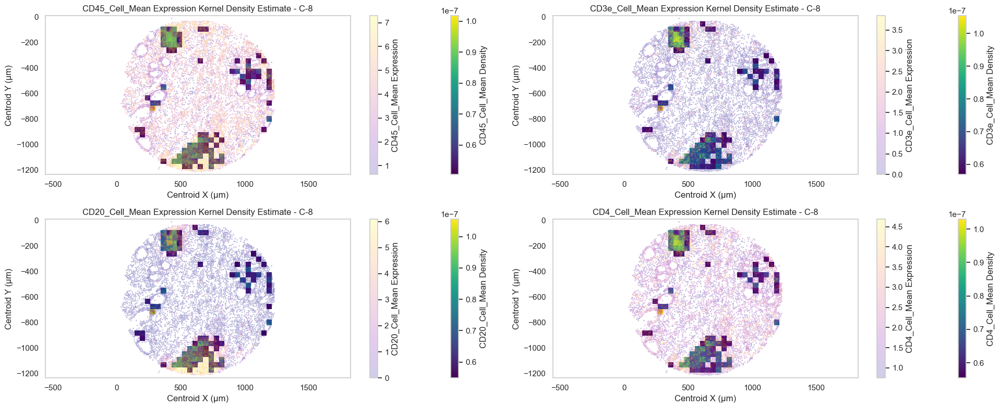

In [625]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import KernelDensity

# Define variables and core
vars = ["CD45_Cell_Mean", "CD3e_Cell_Mean", "CD20_Cell_Mean", "CD4_Cell_Mean"]
core = 'C-8'

# Extract data for the specified core
sset = adata[adata.obs['core'] == core]

# Get the indices of CD45 and CD3e in var names
feature_idxs = [np.where(adata.var_names == var)[0][0] for var in vars]

# Extract coordinates
x = sset.obs['Centroid.X.um'].values
y = -1 * sset.obs['Centroid.Y.um'].values

# Extract expression values
exprs = sset.layers['log_data'][:, feature_idxs]

# Create a figure with two subplots side by side
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2,2, figsize=(20, 8))

for i, (ax, var) in enumerate(zip([ax1, ax2, ax3, ax4], vars)):
    # Combine coordinates and expression for the current variable
    coords_expr = np.column_stack([x, y, exprs[:, i]])

    # Fit the kernel density model
    kde = KernelDensity(bandwidth=10, kernel='gaussian')
    kde.fit(coords_expr)

    # Create a grid for density estimation
    x_grid, y_grid = np.meshgrid(np.linspace(x.min(), x.max(), 30),
                                 np.linspace(y.min(), y.max(), 30))
    xy_grid = np.vstack([x_grid.ravel(), y_grid.ravel()]).T

    # Estimate the density on the grid
    z = np.exp(kde.score_samples(np.column_stack([xy_grid, np.zeros(xy_grid.shape[0])])))
    z = z.reshape(x_grid.shape)

    # Create a mask based on a density threshold
    density_threshold = np.percentile(z, 90)  # Adjust this value to change the masking level
    mask = z > density_threshold

    # Plot
    im = ax.pcolormesh(x_grid, y_grid, np.where(mask, z, np.nan), shading='auto', cmap='viridis')
    scatter = ax.scatter(x, y, c=exprs[:, i], s=1, cmap='plasma', alpha=0.2)
    
    fig.colorbar(im, ax=ax, label=f'{var} Density')
    fig.colorbar(scatter, ax=ax, label=f'{var} Expression')
    
    ax.set_xlabel('Centroid X (µm)')
    ax.set_ylabel('Centroid Y (µm)')
    ax.set_title(f'{var} Expression Kernel Density Estimate - {core}')
    ax.axis('equal')
    ax.grid(False)

plt.tight_layout()
plt.show()


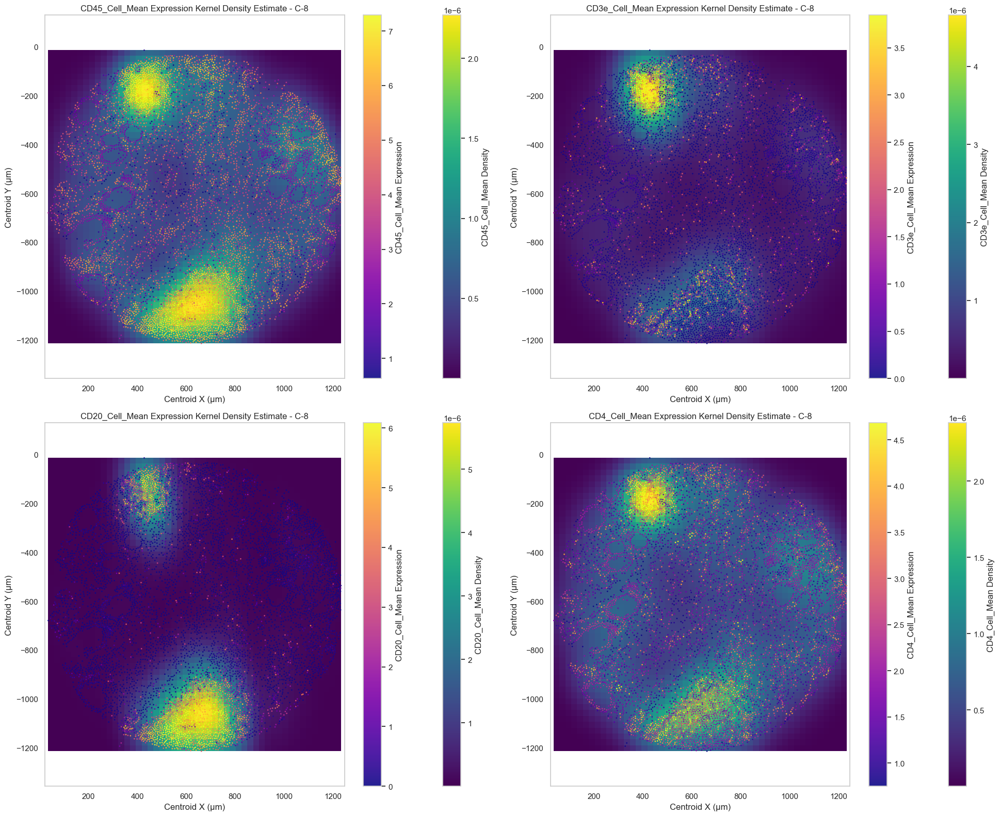

In [635]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

# Define variables and core
vars = ["CD45_Cell_Mean", "CD3e_Cell_Mean", "CD20_Cell_Mean", "CD4_Cell_Mean"]
core = 'C-8'

# Extract data for the specified core
sset = adata[adata.obs['core'] == core]

# Get the indices of variables in var names
feature_idxs = [np.where(adata.var_names == var)[0][0] for var in vars]

# Extract coordinates
x = sset.obs['Centroid.X.um'].values
y = -1 * sset.obs['Centroid.Y.um'].values

# Extract expression values
exprs = sset.layers['log_data'][:, feature_idxs]

# Create a figure with two subplots side by side
fig, axs = plt.subplots(2, 2, figsize=(20, 16))
axs = axs.ravel()

for i, (ax, var) in enumerate(zip(axs, vars)):
    # Create a grid for density estimation
    x_grid = np.linspace(x.min(), x.max(), 50)
    y_grid = np.linspace(y.min(), y.max(), 50)
    xx, yy = np.meshgrid(x_grid, y_grid)
    positions = np.vstack([xx.ravel(), yy.ravel()])

    # Create a single kernel for all points
    kernel = gaussian_kde(np.vstack([x, y]), weights=exprs[:, i])

    # Evaluate the kernel density estimate
    f = np.reshape(kernel(positions), xx.shape)

    # Plot the kernel density estimate
    #im = ax.imshow(np.rot90(f), cmap='viridis', extent=[x.min(), x.max(), y.min(), y.max()], aspect='auto')
    im = ax.imshow(f, cmap='viridis', extent=[x.min(), x.max(), y.min(), y.max()], aspect='auto', origin='lower')

    fig.colorbar(im, ax=ax, label=f'{var} Density')

    # Plot scatter of actual data points
    scatter = ax.scatter(x, y, c=exprs[:, i], s=1, cmap='plasma', alpha=0.9)
    fig.colorbar(scatter, ax=ax, label=f'{var} Expression')
    
    ax.set_xlabel('Centroid X (µm)')
    ax.set_ylabel('Centroid Y (µm)')
    ax.set_title(f'{var} Expression Kernel Density Estimate - {core}')
    ax.axis('equal')
    ax.grid(False)

plt.tight_layout()
plt.show()


In [636]:
os.getcwd()

'P:\\Lab_Members\\Josh\\cedars_analysis\\phenocycler_qupath\\codex_scanpy'

In [640]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import KernelDensity
from matplotlib.backends.backend_pdf import PdfPages

# Define variables
vars = ["CD45_Cell_Mean", "CD3e_Cell_Mean", "CD20_Cell_Mean", "CD4_Cell_Mean"]

# Get unique cores
unique_cores = adata.obs['core'].unique()
# unique_cores = ['B-11', 'B-12']

# Create a PdfPages object
with PdfPages('kernel_density_plots.pdf') as pdf:
    for core in unique_cores:
        print(core)
        # Extract data for the specified core
        sset = adata[adata.obs['core'] == core]

        # Get the indices of variables in var names
        feature_idxs = [np.where(adata.var_names == var)[0][0] for var in vars]

        # Extract coordinates
        x = sset.obs['Centroid.X.um'].values
        y = -1 * sset.obs['Centroid.Y.um'].values

        # Extract expression values
        exprs = sset.layers['log_data'][:, feature_idxs]

        # Create a figure with two subplots side by side
        fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2,2, figsize=(15, 12))

        for i, (ax, var) in enumerate(zip([ax1, ax2, ax3, ax4], vars)):
            # Combine coordinates and expression for the current variable
            coords_expr = np.column_stack([x, y, exprs[:, i]])

            # Fit the kernel density model
            kde = KernelDensity(bandwidth=10, kernel='gaussian')
            kde.fit(coords_expr)

            # Create a grid for density estimation
            x_grid, y_grid = np.meshgrid(np.linspace(x.min(), x.max(), 30),
                                         np.linspace(y.min(), y.max(), 30))
            xy_grid = np.vstack([x_grid.ravel(), y_grid.ravel()]).T

            # Estimate the density on the grid
            z = np.exp(kde.score_samples(np.column_stack([xy_grid, np.zeros(xy_grid.shape[0])])))
            z = z.reshape(x_grid.shape)

            # Create a mask based on a density threshold
            density_threshold = np.percentile(z, 90)  # Adjust this value to change the masking level
            mask = z > density_threshold

            # Plot
            im = ax.pcolormesh(x_grid, y_grid, np.where(mask, z, np.nan), shading='auto', cmap='viridis')
            scatter = ax.scatter(x, y, c=exprs[:, i], s=1, cmap='plasma', alpha=0.2)
            
            fig.colorbar(im, ax=ax, label=f'{var} Density')
            fig.colorbar(scatter, ax=ax, label=f'{var} Expression')
            
            ax.set_xlabel('Centroid X (µm)')
            ax.set_ylabel('Centroid Y (µm)')
            ax.set_title(f'{var} Expression Kernel Density Estimate - {core}')
            ax.axis('equal')
            ax.grid(False)

        plt.tight_layout()
        
        # Add the current figure to the PDF
        pdf.savefig(fig)
        plt.close(fig)

print("PDF saved successfully.")


B-11
B-12
B-3
B-4
B-5
B-6
B-7
B-8
B-9
C-11
C-12
C-3
C-4
C-6
C-7
C-8
C-9
D-10
D-11
D-12
D-3
D-4
D-5
D-6
D-7
D-8
D-9
E-10
E-11
E-12
E-3
E-5
E-6
E-9
F-11
F-12
F-4
F-5
F-6
F-7
F-8
F-9
G-12
G-7
G-8
H-10
H-11
H-12
H-4
H-5
H-6
H-7
H-8
H-9
I-10
I-12
I-5
I-6
I-7
I-8
I-9
J-10
J-11
J-12
J-5
J-7
J-8
J-9
K-7
K-8
K-9
M-1
M-10
M-11
M-12
M-2
M-3
M-4
M-5
M-6
M-7
M-8
M-9
N-10
N-11
N-12
N-2
N-3
N-5
N-6
N-7
N-8
N-9
O-1
O-10
O-11
O-12
O-2
O-4
O-5
O-6
O-7
O-8
O-9
P-10
P-11
P-2
P-4
P-6
P-7
P-9
Q-10
Q-11
Q-12
Q-2
Q-3
Q-4
Q-5
Q-6
Q-7
Q-8
Q-9
R-10
R-11
R-3
R-4
R-6
R-7
R-9
S-10
S-11
S-2
S-3
S-4
S-5
S-6
S-7
S-8
S-9
PDF saved successfully.


In [758]:
adata.obs['core'].value_counts()

core
N-10    21788
M-8     17588
N-8     17242
M-10    14365
N-12    14242
        ...  
S-3      1156
H-4      1141
B-6      1113
F-12      990
D-7       172
Name: count, Length: 139, dtype: int64

In [793]:
core = 'N-12'
clust = 'immune_6'

temp_file = adata.obs[(adata.obs['core'] == core) & (adata.obs['clustering'] == clust)]['Object.ID']
temp_file = pd.DataFrame(temp_file)
temp_file

,Object.ID
486123,0074f9ff-7820-4cbc-a0d9-21a4906fbffd
486128,0087005c-b904-406d-87fc-9da8cfe50967
486302,03abc618-42e8-494d-b12c-0a7038b09e21
486407,05a36df7-a121-48fc-9098-959a3aafbbd8
486551,08480206-0ce3-4900-b06d-ea306c84953c
...,...
500112,fbb8794a-f5f3-4af8-b628-c4275f5595c9
500186,fd433b15-2527-4639-8b29-9492e129a73b
500187,fd50fa60-2092-4c10-a3f9-3512fe2f8fc9
500216,fdd17e3b-7cf6-4d6e-acd1-e4075acaa546


In [794]:
temp_file.to_csv('temp_ids.csv', header = True, index = False)

In [745]:
os.listdir()

['.ipynb_checkpoints',
 'codex_analysis.ipynb',
 'codex_analysis_postqc.ipynb',
 'codex_analysis_postqc_epi_stroma.ipynb',
 'codex_analysis_postqc_immune.ipynb',
 'codex_functions.py',
 'data_for_presentation.csv',
 'immune_subset.ipynb',
 'immune_subset_reduced_features.ipynb',
 'kernel_density_plots.pdf',
 'neighborhood_freqs.ipynb',
 'Screenshot 2024-09-13 124012.png',
 'temp_ids.txt',
 '__pycache__']

In [799]:
# out_file = data_dir + '\\cell_meta.csv'
# adata.obs[['Object.ID','Centroid.X.um', 'Centroid.Y.um', 'core']].to_csv(out_file)